In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from random import randint
import seaborn as sns
from matplotlib import rcParams
import warnings
import pickle
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.cluster import KMeans
import json
import os
sns.set_theme()
rcParams["figure.figsize"] = [20,5] 
warnings.filterwarnings("ignore")
COLORS = list(mcolors.CSS4_COLORS.keys())

## Functions

In [2]:
def prepareData(data, stationData):
   df = data.merge(stationData, left_on="Start station number", right_on="short_name")
   df = df.groupby(["time", "cluster", "isHoliday"]).agg(
        Rides = ("Duration", "count"),
        AverageDuration = ("Duration", "mean"),
        Temp = ("temperature_2m", "mean"),
        Humidity = ("relativehumidity_2m", "mean"),
        Rainfall = ("precipitation", "mean"),
        Wind = ("windspeed_10m", "mean")).reset_index()
   
   df["time"] = df["time"].apply(lambda x: pd.to_datetime(x))
   df = df.sort_values(by="time", ascending=True)
   df["hour"] = df["time"].apply(lambda x: int(x.strftime("%H")))
   df["day"] = df["time"].apply(lambda x: int(x.strftime("%w")))
   df["month"] = df["time"].apply(lambda x: int(x.strftime("%m")))
   df["isWeekend"] = df["day"].apply(lambda x: 1 if x>= 6 else 0)
   return df

def getTrainingDataset(df, cluster=0, strategy="mean"):
   group = ["hour", "day", "isWeekend", "month", "isHoliday"]
   dataset = df[df.cluster == cluster]
   temp = dataset.groupby(group).agg(
        Rides = ("Rides", "sum"),
        AverageDuration = ("AverageDuration", strategy),
        Temp = ("Temp", strategy),
        Humidity = ("Humidity", strategy),
        Rainfall = ("Rainfall", strategy),
        Wind = ("Wind", strategy),
        Count = ("Rides", "count")
    ).reset_index()
   
   return temp

def createOrdinalEncoding(df):
    encoder = OneHotEncoder(drop="first")

    encoded_hour = pd.DataFrame(encoder.fit_transform(df.hour.values.reshape(-1,1)).toarray(), columns = [f"hour_{h}" for h in range(23)])
    encoded_day = pd.DataFrame(encoder.fit_transform(df.day.values.reshape(-1,1)).toarray(), columns = [f"day_{d}" for d in range(6)])
    encoded_month = pd.DataFrame(encoder.fit_transform(df.month.values.reshape(-1,1)).toarray(), columns = [f"month_{m}" for m in range(11)])

    temporalDataset = pd.concat([encoded_hour, encoded_day, encoded_month], axis=1)

    trainingDataset = pd.concat([temporalDataset, df], axis=1)

    return trainingDataset

def createCyclicalFeatures(df):
    TWO_PI = 2. * np.pi
    df["hour_cycle"] = np.sin(df.hour * (TWO_PI/24))
    df["day_cycle"] = np.sin(df.day * (TWO_PI/7))
    df["month_cycle"] = np.sin((df.month - 1) * (TWO_PI/12))

    return df

In [3]:
def trainModel(df, model, features, target="Rides"):
    X_train = df[features].values
    y_train = df[target]

    model.fit(X_train, y_train)

    y_pred = model.predict(X_train)

    r2, mae, rmse = r2_score(y_pred, y_train), mean_absolute_error(y_pred, y_train), mean_squared_error(y_pred, y_train, squared=False)

    return y_pred, r2, mae, rmse

def linearModel(df, features):
    model = LinearRegression()
    y_pred, r2, mae, rmse = trainModel(df, model, features)
    return model, y_pred, r2, mae, rmse

def randomForest(df, features):
    model = RandomForestRegressor(n_estimators=32)
    y_pred, r2, mae, rmse = trainModel(df, model, features)
    return model, y_pred, r2, mae, rmse

In [4]:
def testClusters(stationData, n_clusters):
    kmeans = KMeans(n_clusters = n_clusters, algorithm="lloyd")
    trainData = stationData[["lat", "lon"]].values
    kmeans.fit(trainData)
    stationData.loc[:,"cluster"] = kmeans.predict(trainData)
    fig, ax = plt.subplots(1,1,figsize=(5,5))
    ind = [randint(0, len(COLORS)) for _ in range(0, n_clusters)]
    for i in range(n_clusters):
        stationData[stationData.cluster == i].plot.scatter(y="lat", x="lon", ax=ax, color=COLORS[ind[i]])
    
    return stationData

def top3Feat(model, features, type="RF"):
    if type == "RF":
        fis = model.feature_importances_
    else:
        fis = model.coef_
    featImp = {}
    for feat, fi in zip(features, fis):
        featImp[feat] = fi

    sortedFeatImp = {k: v for k, v in sorted(featImp.items(), key=lambda item: item[1], reverse=True)}
    sortedFeatImp = pd.DataFrame.from_dict(sortedFeatImp, orient="index").reset_index()
    top3 = list(sortedFeatImp.iloc[:3,0].values)
    top3 = ", ".join(top3)
    return top3

def getFeatImp(model, features, type="RF"):
    if type == "RF":
        fis = model.feature_importances_
    else:
        fis = model.coef_

    featImp = {}
    for feat, fi in zip(features, fis):
        featImp[feat] = fi

    sortedFeatImp = {k: v for k, v in sorted(featImp.items(), key=lambda item: item[1], reverse=True)}
    sortedFeatImp = pd.DataFrame.from_dict(sortedFeatImp, orient="index").reset_index()
    sortedFeatImp.columns = ["feature", "importance"]
    return sortedFeatImp

DO NOT TOUCH

In [5]:
# import certifi
# import ssl
# import geopy.geocoders
# from geopy.geocoders import Nominatim
# ctx = ssl.create_default_context(cafile=certifi.where())
# geopy.geocoders.options.default_ssl_context = ctx
# geolocator = Nominatim(user_agent="dab-project", scheme='http')
# county = []
# for row in range(len(stationData)):
#     if row % 100 == 0:
#         print(row)
    # county.append(geolocator.reverse((stationData['lat'][row], stationData['lon'][row])))

## Execution

In [6]:
temporalFeatures = []
for h in range(23):
    temporalFeatures.append(f"hour_{h}")
for d in range(6):
    temporalFeatures.append(f"day_{d}")
for m in range(11):
    temporalFeatures.append(f"month_{m}")

catFeatures = ["hour", "day", "month"]
weatherFeatures = ["Temp", "Humidity", "Rainfall", "Wind"]
cyclicalTemporalFeatures = ["hour_cycle", "day_cycle", "month_cycle"]
weekendFeature = ["isWeekend"]
holidayFeature = ["isHoliday"]
target = "Rides"

In [46]:
data = pd.read_csv("/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Other Files/MasterDataset_WithWeatherAndEvent.csv")

with open("/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Data/stationData.json") as file:
    stationData = json.load(file)
stationData = pd.DataFrame(stationData["data"]["stations"])
stationData["short_name"] = stationData["short_name"].apply(lambda x: float(x))

### Only Temporal

In [15]:
MODELS = []

#### Linear Model

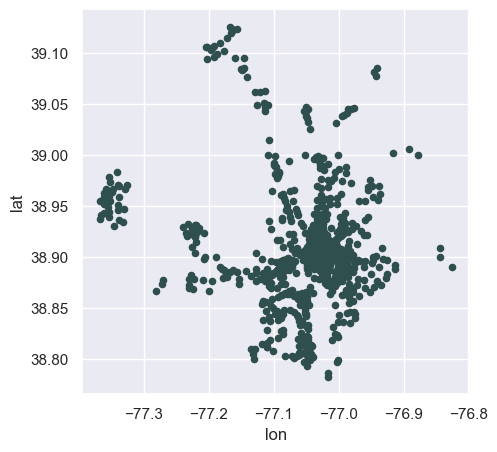

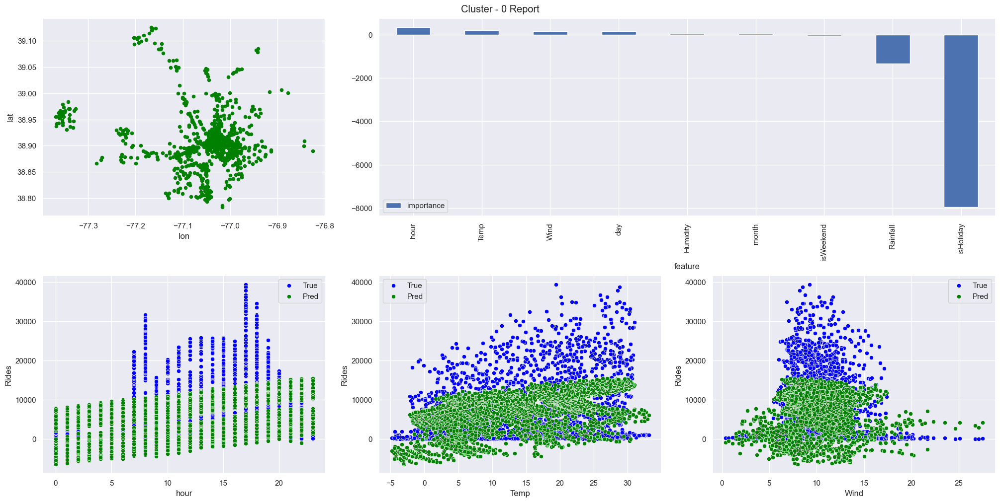

In [22]:
stationData = testClusters(stationData, 1)
df = prepareData(data, stationData)

cluster = 0
fig = plt.figure(constrained_layout=True, figsize=(20,10))
gs = fig.add_gridspec(2,3)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1:])
ax3 = fig.add_subplot(gs[1,0])
ax4 = fig.add_subplot(gs[1,1])
ax5 = fig.add_subplot(gs[1,2])

stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

trainData = getTrainingDataset(df, cluster)
features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
model, y_pred, r2, mae, rmse = linearModel(trainData, features)
with open("./Lin_Ord.pickle", "wb") as file:
    pickle.dump(model, file)
trainData.loc[:,"predRides"] = y_pred
fi = getFeatImp(model, features, "lin")

fi.plot.bar(x="feature", y="importance", ax=ax2)
feats = [feat.strip() for feat in top3Feat(model,features, "lin").split(",")]

sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

fig.suptitle(f"Cluster - {cluster} Report")

MODELS.append({
    "Model": "LinearModel_Ordinal",
    "r2": r2,
    "mae": mae,
    "rmse": rmse
})

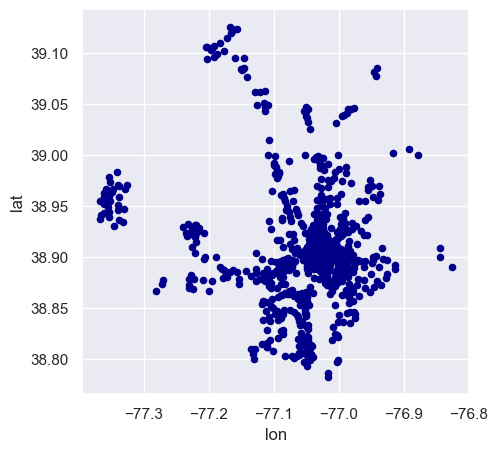

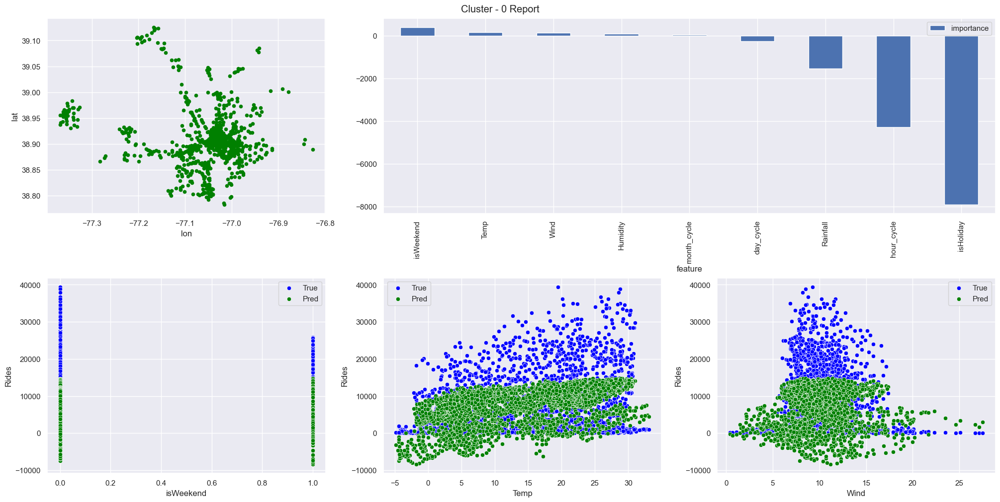

In [23]:
stationData = testClusters(stationData, 1)
df = prepareData(data, stationData)

cluster = 0
fig = plt.figure(constrained_layout=True, figsize=(20,10))
gs = fig.add_gridspec(2,3)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1:])
ax3 = fig.add_subplot(gs[1,0])
ax4 = fig.add_subplot(gs[1,1])
ax5 = fig.add_subplot(gs[1,2])

stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

trainData = getTrainingDataset(df, cluster)
trainData = createCyclicalFeatures(trainData)
features = cyclicalTemporalFeatures + weatherFeatures + weekendFeature + holidayFeature
model, y_pred, r2, mae, rmse = linearModel(trainData, features)
with open("./Lin_Cyc.pickle", "wb") as file:
    pickle.dump(model, file)
trainData.loc[:,"predRides"] = y_pred
fi = getFeatImp(model, features, "lin")

fi.plot.bar(x="feature", y="importance", ax=ax2)
feats = [feat.strip() for feat in top3Feat(model,features, "lin").split(",")]

sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

fig.suptitle(f"Cluster - {cluster} Report")

MODELS.append({
    "Model": "LinearModel_Cyc",
    "r2": r2,
    "mae": mae,
    "rmse": rmse
})

#### Random Forest

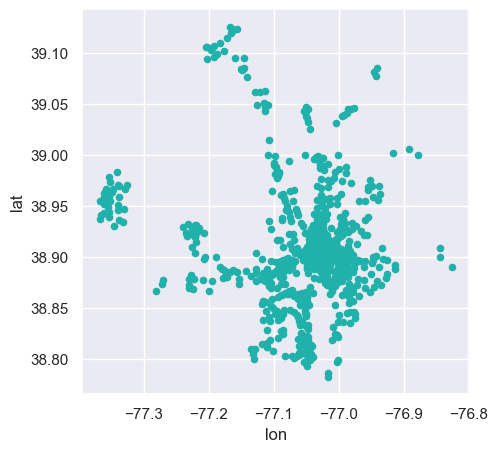

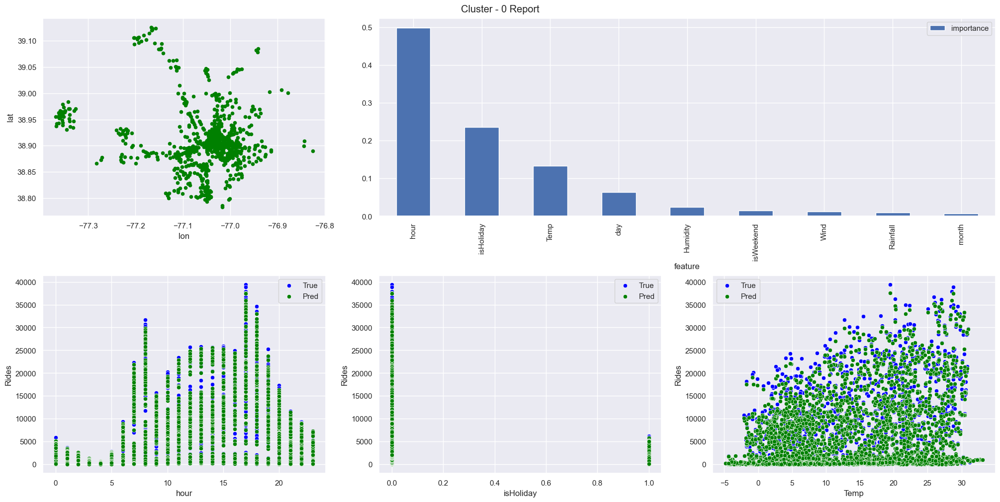

In [24]:
stationData = testClusters(stationData, 1)
df = prepareData(data, stationData)

cluster = 0
fig = plt.figure(constrained_layout=True, figsize=(20,10))
gs = fig.add_gridspec(2,3)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1:])
ax3 = fig.add_subplot(gs[1,0])
ax4 = fig.add_subplot(gs[1,1])
ax5 = fig.add_subplot(gs[1,2])

stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

trainData = getTrainingDataset(df, cluster)
features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
model, y_pred, r2, mae, rmse = randomForest(trainData, features)
with open("./RF_Ord.pickle", "wb") as file:
    pickle.dump(model, file)
trainData.loc[:,"predRides"] = y_pred
fi = getFeatImp(model, features)

fi.plot.bar(x="feature", y="importance", ax=ax2)
feats = [feat.strip() for feat in top3Feat(model,features).split(",")]

sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

fig.suptitle(f"Cluster - {cluster} Report")

MODELS.append({
    "Model": "RandomForest_Ord",
    "r2": r2,
    "mae": mae,
    "rmse": rmse
})

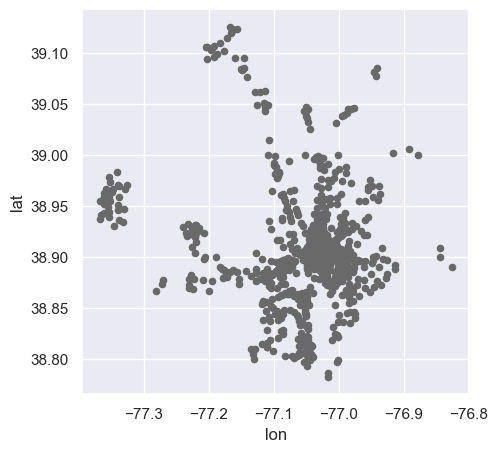

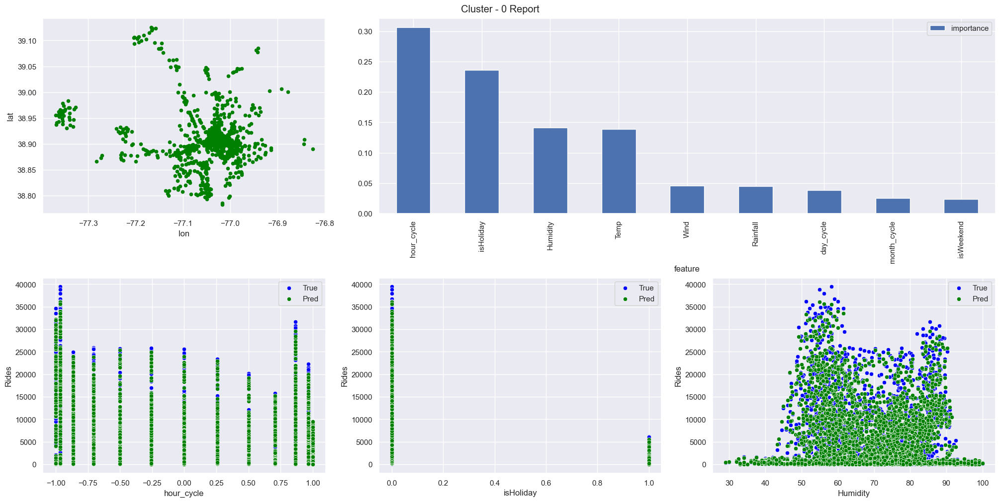

In [25]:
stationData = testClusters(stationData, 1)
df = prepareData(data, stationData)

cluster = 0
fig = plt.figure(constrained_layout=True, figsize=(20,10))
gs = fig.add_gridspec(2,3)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1:])
ax3 = fig.add_subplot(gs[1,0])
ax4 = fig.add_subplot(gs[1,1])
ax5 = fig.add_subplot(gs[1,2])

stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

trainData = getTrainingDataset(df, cluster)
trainData = createCyclicalFeatures(trainData)
features = cyclicalTemporalFeatures + weatherFeatures + weekendFeature + holidayFeature
model, y_pred, r2, mae, rmse = randomForest(trainData, features)
with open("./RF_Cyc.pickle", "wb") as file:
    pickle.dump(model, file)
trainData.loc[:,"predRides"] = y_pred
fi = getFeatImp(model, features)

fi.plot.bar(x="feature", y="importance", ax=ax2)
feats = [feat.strip() for feat in top3Feat(model,features).split(",")]

sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

fig.suptitle(f"Cluster - {cluster} Report")

MODELS.append({
    "Model": "RandomForest_Cycl",
    "r2": r2,
    "mae": mae,
    "rmse": rmse
})

In [28]:
MODELS = MODELS[4:]

In [30]:
pd.DataFrame(MODELS).to_csv("/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Data/TemporalModels.csv")

### 20 Clusters

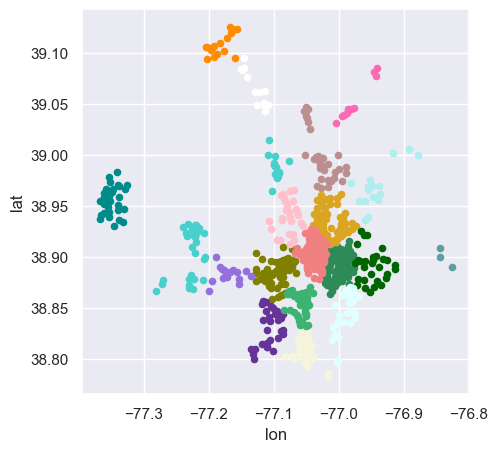

In [32]:
stationData = testClusters(stationData, 20)
stationInfo = stationData.groupby("cluster").agg(
    Lat = ("lat", "mean"),
    Lon = ("lon", "mean"),
    TotCap = ("capacity", "sum"),
    AvgCap = ("capacity", "mean"))

In [33]:
df = prepareData(data, stationData)

In [34]:
REPORT = []
os.makedirs("/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Visualizations/20Clusters/")
path = "/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Visualizations/20Clusters/"
for cluster in range(20):
    fig = plt.figure(constrained_layout=True, figsize=(20,10))
    gs = fig.add_gridspec(2,3)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1:])
    ax3 = fig.add_subplot(gs[1,0])
    ax4 = fig.add_subplot(gs[1,1])
    ax5 = fig.add_subplot(gs[1,2])

    stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
    stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

    trainData = getTrainingDataset(df, cluster)
    features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
    model, y_pred, r2, mae, rmse = randomForest(trainData, features)
    trainData.loc[:,"predRides"] = y_pred
    fi = getFeatImp(model, features)

    fi.plot.bar(x="feature", y="importance", ax=ax2)
    feats = [feat.strip() for feat in top3Feat(model,features).split(",")]

    sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
    sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

    sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
    sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

    sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
    sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

    fig.suptitle(f"Cluster - {cluster} Report")
    
    fig.savefig(f"{path}/Cluster{cluster}.png")

    REPORT.append({
        "Cluster": cluster,
        "r2": r2,
        "mae": mae,
        "rmse": rmse,
        "totalCapacity": stationInfo.loc[cluster, "TotCap"],
        "location": f"({np.round(stationInfo.loc[cluster, 'Lat'],2), np.round(stationInfo.loc[cluster, 'Lon'],2)})",
        "averageHourlyRides": np.mean(y_pred),
        "maxHourlyRides": np.max(y_pred)
    })

pd.DataFrame(REPORT).to_csv(f"/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Data/20Cluster__ModelPerformance.csv")

FileExistsError: [Errno 17] File exists: '/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Visualizations/20Clusters/'

In [42]:
report = pd.DataFrame(REPORT)
report

,Unnamed: 0,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides
0,0,0,0.989752,11.201209,396.823643,525,"((38.85, -77.06))",166.567054,1012.00000
1,1,1,0.952031,1.459161,4.682279,389,"((38.91, -77.23))",10.869470,56.87500
2,2,2,0.990684,6.279670,151.804230,506,"((38.93, -76.99))",106.232160,833.21875
3,3,3,0.948107,1.569096,5.383999,175,"((39.05, -77.12))",11.162558,60.50000
4,4,4,0.993963,21.594274,1551.369970,1015,"((38.89, -77.09))",420.163795,2396.65625
5,5,5,0.993507,149.295621,79114.585561,2248,"((38.9, -77.04))",2917.395023,18650.50000
6,6,6,0.963192,2.058213,9.785730,476,"((38.96, -77.35))",16.210009,111.34375
7,7,7,0.989387,4.372838,54.909158,545,"((39.0, -77.03))",63.493866,359.81250
8,8,8,0.995152,78.768705,21329.670599,1958,"((38.89, -77.0))",1765.442787,9551.18750
9,9,9,0.973489,2.352181,14.831357,339,"((39.1, -77.17))",21.543165,140.43750


In [43]:
report.sort_values(by=["r2", "rmse", "mae"])

,Unnamed: 0,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides
13,13,13,0.788256,0.381383,0.289155,47,"((38.9, -76.84))",2.076696,8.81250
18,18,18,0.873030,0.585113,0.704657,171,"((39.06, -76.97))",3.128300,18.40625
15,15,15,0.939399,1.034701,2.326287,233,"((38.97, -76.94))",7.184520,33.84375
3,3,3,0.948107,1.569096,5.383999,175,"((39.05, -77.12))",11.162558,60.50000
1,1,1,0.952031,1.459161,4.682279,389,"((38.91, -77.23))",10.869470,56.87500
6,6,6,0.963192,2.058213,9.785730,476,"((38.96, -77.35))",16.210009,111.34375
11,11,11,0.966066,1.974978,9.057812,283,"((38.88, -77.16))",17.711882,81.78125
19,19,19,0.971467,1.770624,7.614413,399,"((38.89, -76.94))",16.154700,90.71875
9,9,9,0.973489,2.352181,14.831357,339,"((39.1, -77.17))",21.543165,140.43750
16,16,16,0.977782,2.710506,19.284957,494,"((38.85, -76.99))",28.730929,153.40625


In [44]:
report[report.averageHourlyRides > report.totalCapacity]

,Unnamed: 0,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides
5,5,5,0.993507,149.295621,79114.585561,2248,"((38.9, -77.04))",2917.395023,18650.5


In [45]:
report[report.totalCapacity > 7*report.maxHourlyRides]

,Unnamed: 0,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides
18,18,18,0.87303,0.585113,0.704657,171,"((39.06, -76.97))",3.1283,18.40625


### 45 Clusters

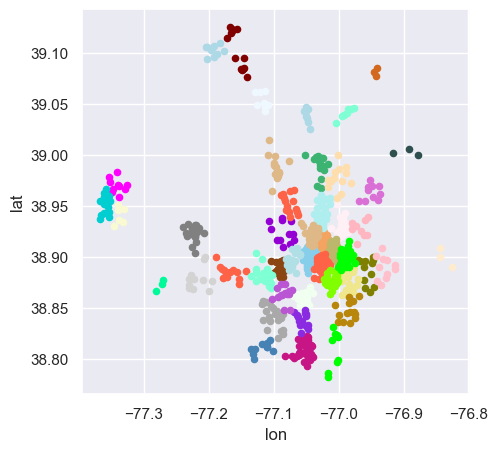

In [47]:
stationData = testClusters(stationData, 45)
stationInfo = stationData.groupby("cluster").agg(
    Lat = ("lat", "mean"),
    Lon = ("lon", "mean"),
    TotCap = ("capacity", "sum"),
    AvgCap = ("capacity", "mean"))

In [48]:
df = prepareData(data, stationData)

No Data from these stations
No Data from these stations


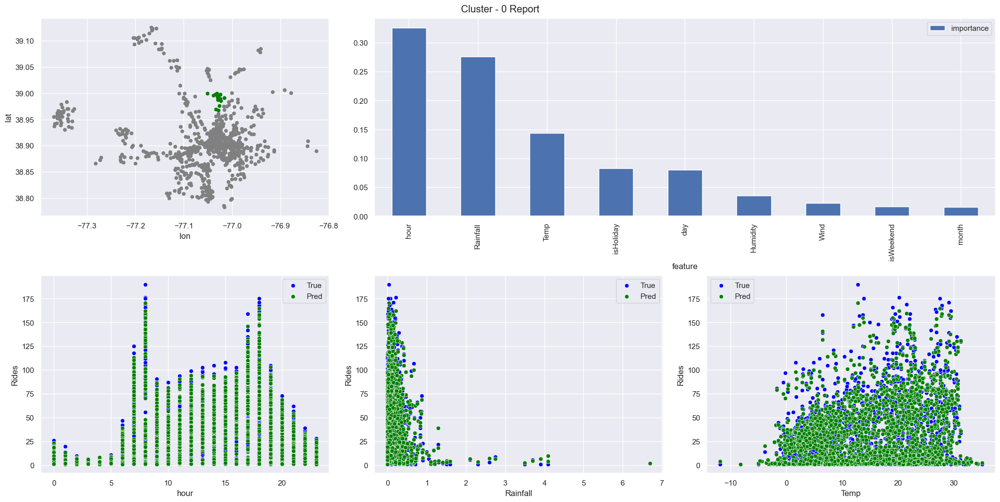

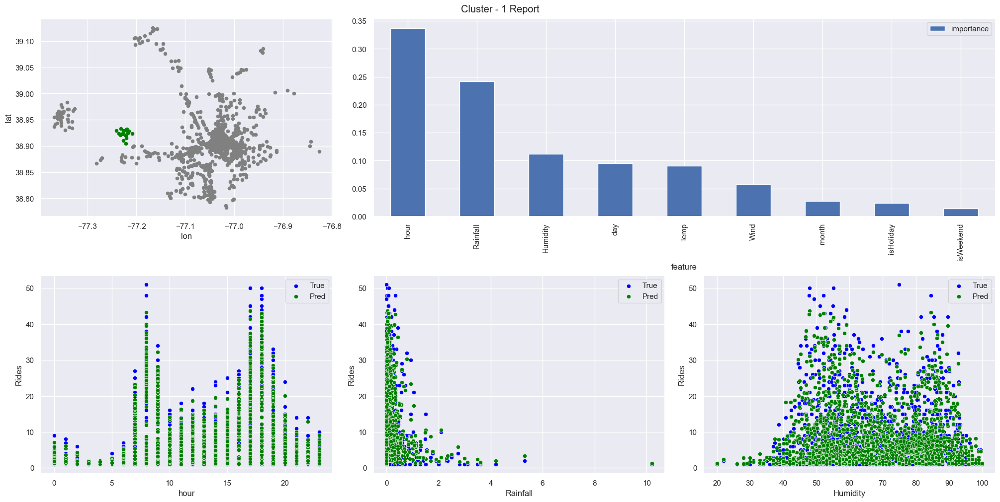

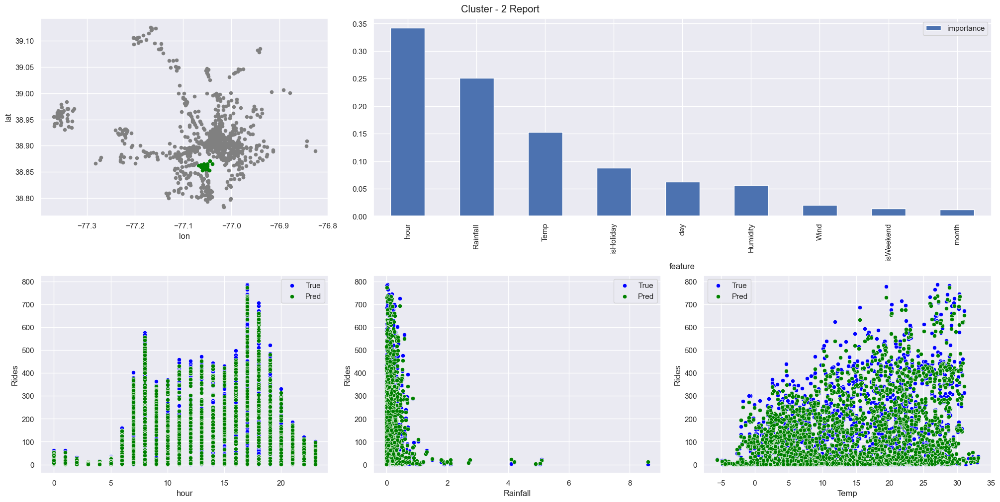

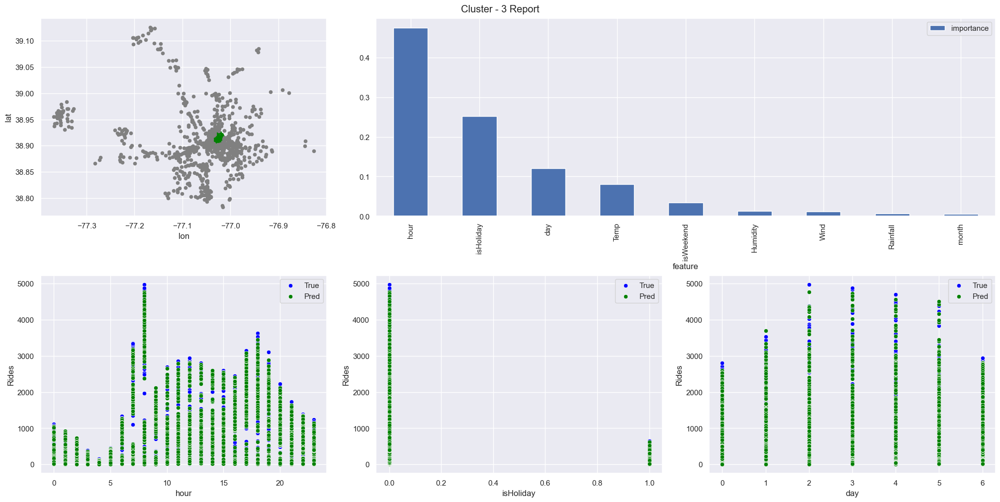

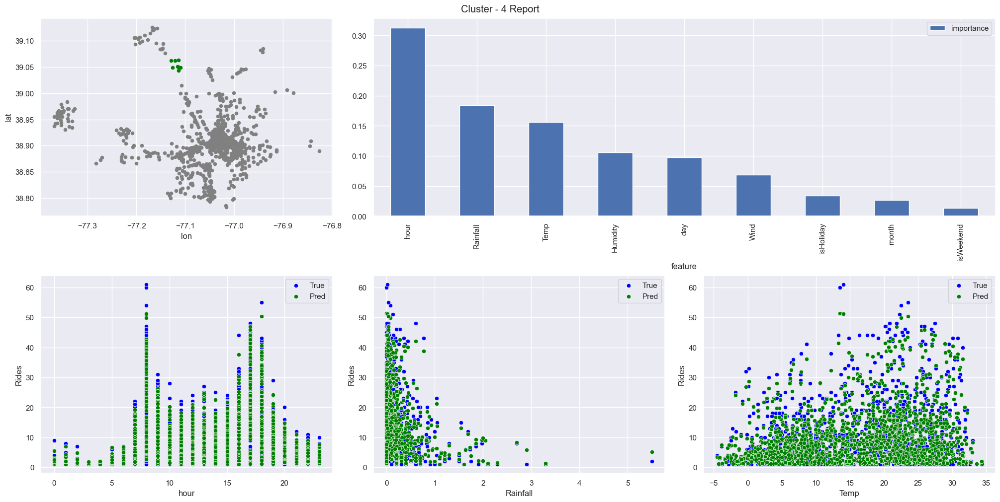

...

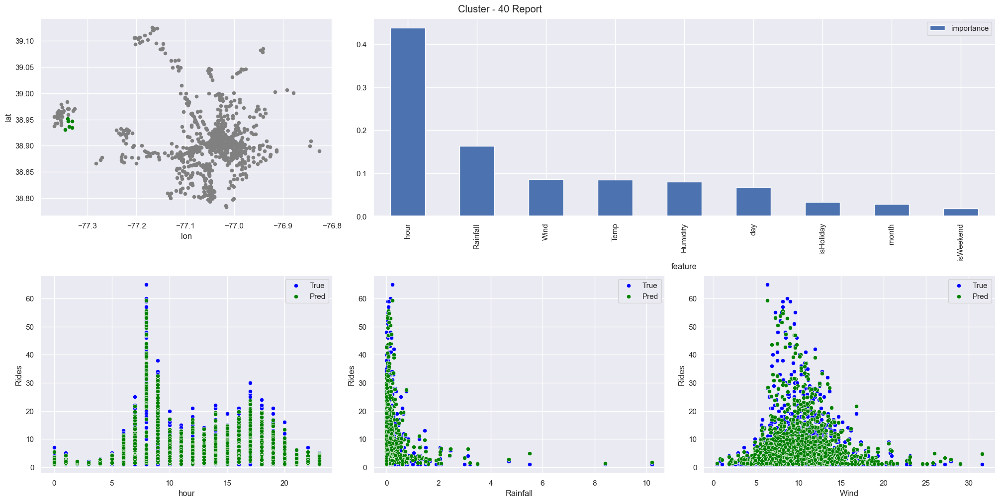

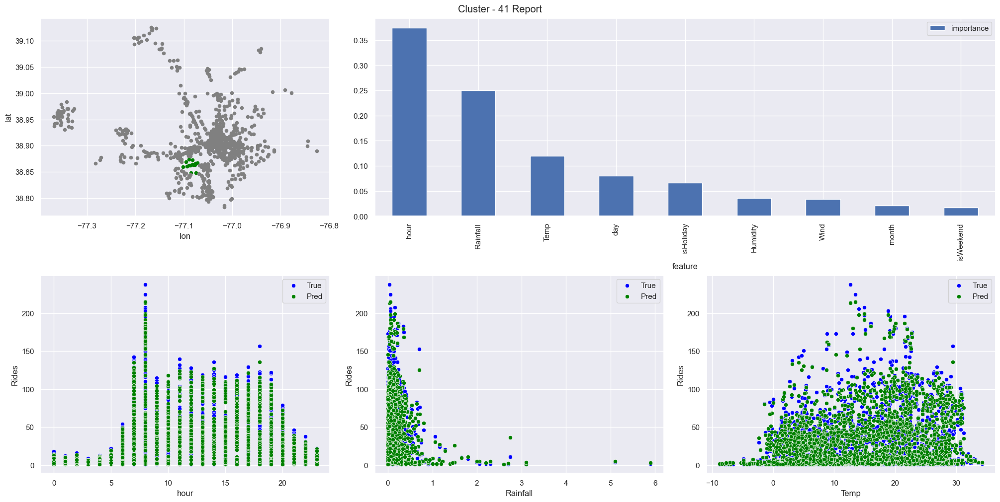

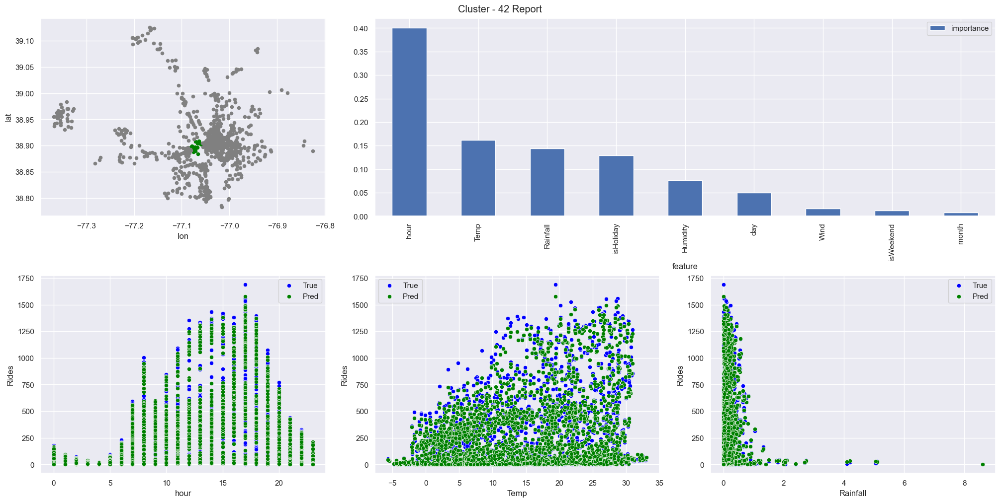

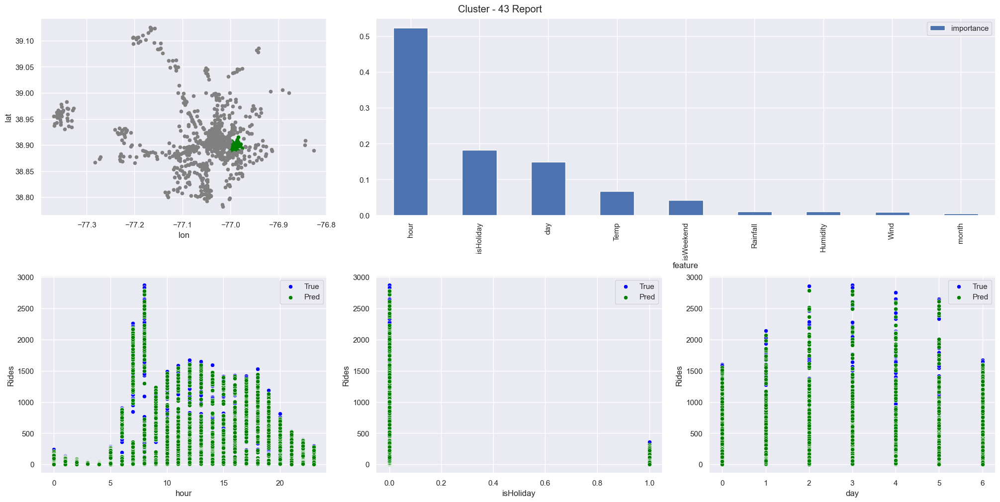

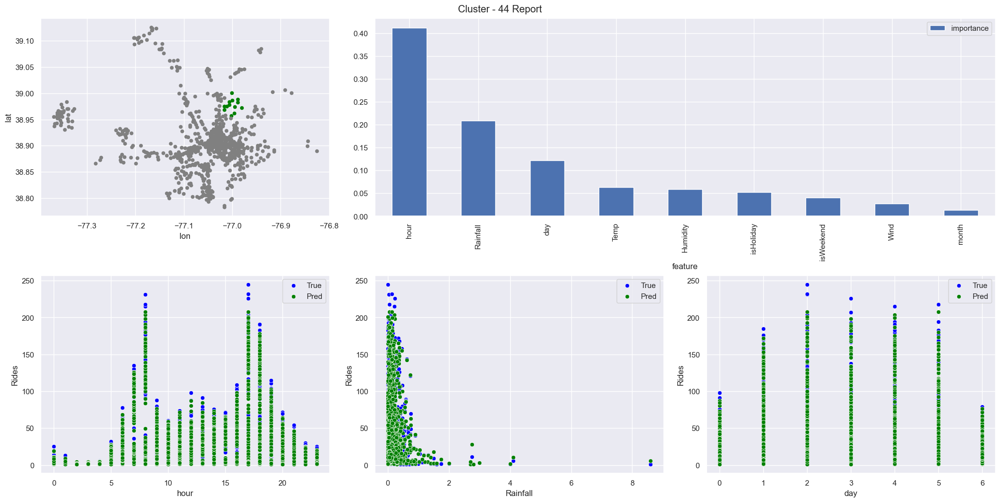

In [49]:
REPORT = []
# os.makedirs("/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Visualizations/45Clusters/")
path = "/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Visualizations/45Clusters/"
for cluster in range(45):
    fig = plt.figure(constrained_layout=True, figsize=(20,10))
    gs = fig.add_gridspec(2,3)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1:])
    ax3 = fig.add_subplot(gs[1,0])
    ax4 = fig.add_subplot(gs[1,1])
    ax5 = fig.add_subplot(gs[1,2])

    stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
    stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

    trainData = getTrainingDataset(df, cluster)
    if len(trainData) == 0:
        print("No Data from these stations")
        fig.suptitle(f"Cluster - {cluster} Report")
        fig.savefig(f"{path}/Cluster{cluster}.png")
        REPORT.append({
            "Cluster": cluster,
            "r2": np.nan,
            "mae": np.nan,
            "rmse": np.nan,
            "totalCapacity": stationInfo.loc[cluster, "TotCap"],
            "location": f"({np.round(stationInfo.loc[cluster, 'Lat'],2), np.round(stationInfo.loc[cluster, 'Lon'],2)})",
            "averageHourlyRides": np.nan,
            "maxHourlyRides": np.nan,
            "topFeatures": ""
        })
        continue
    
    features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
    model, y_pred, r2, mae, rmse = randomForest(trainData, features)
    trainData.loc[:,"predRides"] = y_pred
    fi = getFeatImp(model, features)

    fi.plot.bar(x="feature", y="importance", ax=ax2)
    feats = [feat.strip() for feat in top3Feat(model,features).split(",")]

    sns.scatterplot(data=trainData, x=feats[0], y="Rides", label="True", color="blue", ax=ax3)
    sns.scatterplot(data=trainData, x=feats[0], y="predRides", label="Pred", color="green", ax=ax3)

    sns.scatterplot(data=trainData, x=feats[1], y="Rides", label="True", color="blue", ax=ax4)
    sns.scatterplot(data=trainData, x=feats[1], y="predRides", label="Pred", color="green", ax=ax4)

    sns.scatterplot(data=trainData, x=feats[2], y="Rides", label="True", color="blue", ax=ax5)
    sns.scatterplot(data=trainData, x=feats[2], y="predRides", label="Pred", color="green", ax=ax5)

    fig.suptitle(f"Cluster - {cluster} Report")
    
    fig.savefig(f"{path}/Cluster{cluster}.png")

    REPORT.append({
        "Cluster": cluster,
        "r2": r2,
        "mae": mae,
        "rmse": rmse,
        "totalCapacity": stationInfo.loc[cluster, "TotCap"],
        "location": f"({np.round(stationInfo.loc[cluster, 'Lat'],2), np.round(stationInfo.loc[cluster, 'Lon'],2)})",
        "averageHourlyRides": np.mean(y_pred),
        "maxHourlyRides": np.max(y_pred),
        "topFeatures": top3Feat(model,features)
    })

pd.DataFrame(REPORT).to_csv(f"/Users/sid98/OMSA/01_MGT_6203_Data_Analytics_in_Business/Project/Team-83/Data/45Cluster__ModelPerformance.csv")

In [50]:
report = pd.DataFrame(REPORT)
report

,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides,topFeatures
0,0,0.981374,2.845953,4.511711,244,"((38.99, -77.03))",32.695883,170.46875,"hour, Rainfall, Temp"
1,1,0.955026,1.187184,1.777453,237,"((38.92, -77.22))",8.967820,43.75000,"hour, Rainfall, Humidity"
2,2,0.989951,8.736931,14.785238,294,"((38.86, -77.05))",126.632163,773.43750,"hour, Rainfall, Temp"
3,3,0.996600,30.244304,51.986400,653,"((38.91, -77.03))",809.074767,4774.31250,"hour, isHoliday, day"
4,4,0.947457,1.367700,2.026873,145,"((39.05, -77.12))",9.717524,51.34375,"hour, Rainfall, Temp"
5,5,0.963168,1.573440,2.548676,188,"((38.89, -76.96))",13.217814,73.62500,"hour, Rainfall, Temp"
6,6,0.979395,2.470726,3.967297,273,"((38.84, -77.1))",26.139174,136.31250,"hour, Rainfall, Temp"
7,7,0.788690,0.449553,0.653587,133,"((38.97, -77.34))",2.410840,11.81250,"Temp, Humidity, Wind"
8,8,0.989154,8.680644,15.400358,553,"((38.81, -77.05))",128.827277,802.87500,"hour, Rainfall, Temp"
9,9,0.991673,8.687915,15.115634,310,"((38.89, -77.09))",145.899794,859.84375,"hour, Rainfall, Temp"


In [90]:
clustersWithLowR2 = report.sort_values(by=["r2", "rmse", "mae"]).iloc[:5,:].Cluster.values

In [71]:
clustersWithLowCapacity = report[report.averageHourlyRides > report.totalCapacity].Cluster.values

In [72]:
clustersWithHighCapacity = report[report.totalCapacity > 7*report.maxHourlyRides].Cluster.values

In [73]:
report["topFeaturesSet"] = report.topFeatures.apply(lambda x: set([item.strip() for item in x.split(",")]))

In [76]:
clustersWithDifferentFeatures = report[report["topFeaturesSet"].apply(lambda x: len(x.union(set(["hour", "Temp", "isHoliday"]))) > 4)].Cluster.values

<Axes: xlabel='lon', ylabel='lat'>

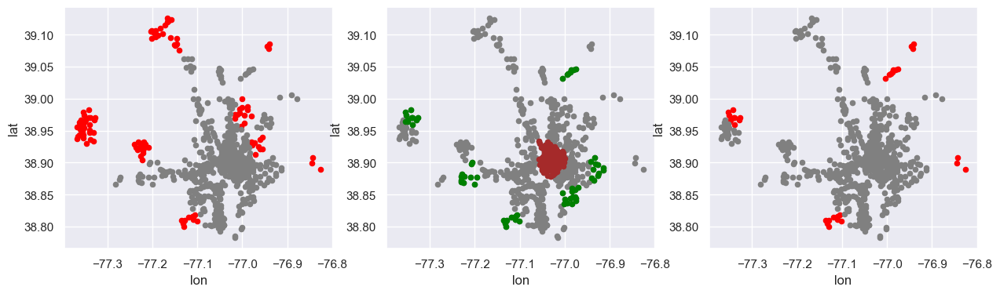

In [95]:
fig, ax = plt.subplots(1,3,figsize=(15,4))
stationData[stationData.cluster.isin(clustersWithDifferentFeatures)].plot.scatter(x="lon", y="lat", color="red", ax=ax[0])
stationData[~stationData.cluster.isin(clustersWithDifferentFeatures)].plot.scatter(x="lon", y="lat", color="grey", ax=ax[0])

stationData.plot.scatter(x="lon", y="lat", color="grey", ax=ax[1])
stationData[stationData.cluster.isin(clustersWithLowCapacity)].plot.scatter(x="lon", y="lat", color="brown", ax=ax[1])
stationData[stationData.cluster.isin(clustersWithHighCapacity)].plot.scatter(x="lon", y="lat", color="green", ax=ax[1])


stationData[stationData.cluster.isin(clustersWithLowR2)].plot.scatter(x="lon", y="lat", color="red", ax=ax[2])
stationData[~stationData.cluster.isin(clustersWithLowR2)].plot.scatter(x="lon", y="lat", color="grey", ax=ax[2])

Text(0.5, 1.0, 'Clusters with disproportionate demand')

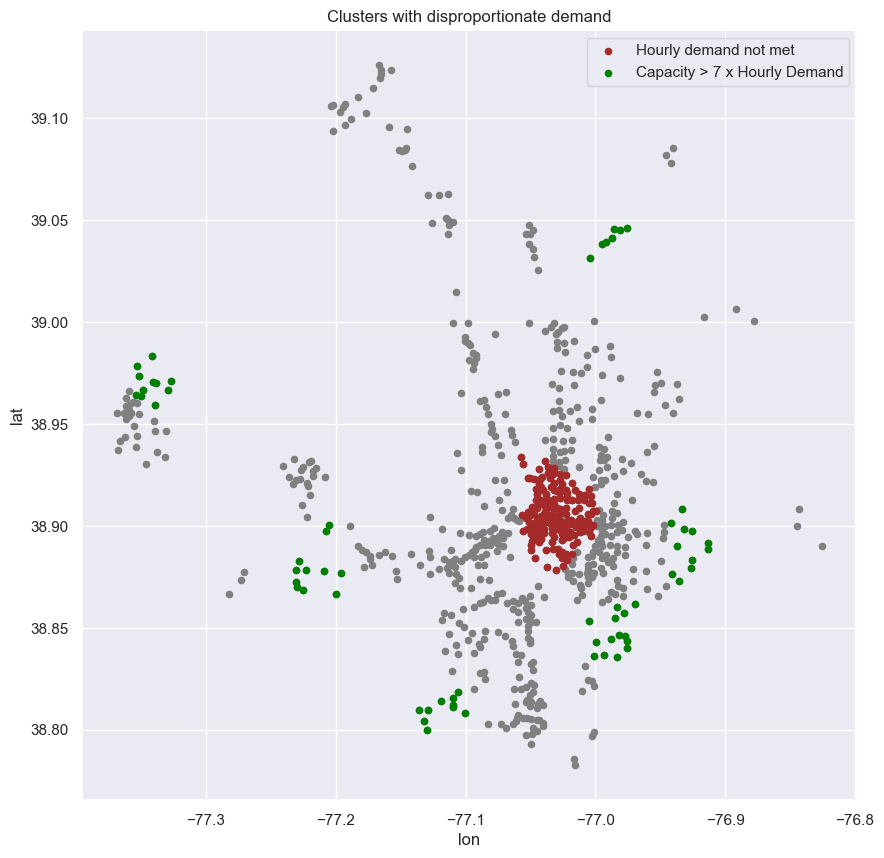

In [149]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
stationData.plot.scatter(x="lon", y="lat", color="grey", ax=ax)
stationData[stationData.cluster.isin(clustersWithLowCapacity)].plot.scatter(x="lon", y="lat", color="brown", ax=ax, label="Hourly demand not met")
stationData[stationData.cluster.isin(clustersWithHighCapacity)].plot.scatter(x="lon", y="lat", color="green", ax=ax, label="Capacity > 7 x Hourly Demand")

plt.legend(loc="best")
ax.set_title("Clusters with disproportionate demand")

In [141]:
clustersWithDifferentFeatures[0], clustersWithDifferentFeatures[2]

(1, 11)

In [89]:
print(clustersWithLowCapacity)

print("  ")

print(clustersWithHighCapacity)

print("  ")

print(clustersWithLowR2)

print("  ")

print(clustersWithDifferentFeatures)

[ 3 19 21 30 35]
  
[ 7 18 23 25 28 34]
  
[28 14 18  7 32]
  
[ 1  7 11 14 22 28 32 36 37 40 44]


In [91]:
set(clustersWithLowCapacity).intersection(set(clustersWithHighCapacity)).intersection(set(clustersWithLowR2)).intersection(set(clustersWithDifferentFeatures))

set()

In [97]:
report[report.Cluster.isin(clustersWithDifferentFeatures)]

,Cluster,r2,mae,rmse,totalCapacity,location,averageHourlyRides,maxHourlyRides,topFeatures,topFeaturesSet
1,1,0.955026,1.187184,1.777453,237,"((38.92, -77.22))",8.967820,43.75000,"hour, Rainfall, Humidity","{Humidity, hour, Rainfall}"
7,7,0.788690,0.449553,0.653587,133,"((38.97, -77.34))",2.410840,11.81250,"Temp, Humidity, Wind","{Temp, Humidity, Wind}"
11,11,0.948722,1.267806,1.929217,154,"((39.1, -77.19))",8.712216,59.37500,"Rainfall, hour, Humidity","{Humidity, hour, Rainfall}"
14,14,0.755867,0.400534,0.567482,47,"((38.9, -76.84))",2.094036,8.53125,"Wind, Temp, Humidity","{Temp, Humidity, Wind}"
22,22,0.964618,1.620092,2.940151,143,"((38.93, -76.97))",13.015001,110.15625,"hour, Rainfall, day","{hour, Rainfall, day}"
28,28,0.567831,0.274038,0.356592,152,"((38.81, -77.12))",1.642920,4.06250,"Temp, Wind, Humidity","{Temp, Humidity, Wind}"
32,32,0.852303,0.478484,0.705264,61,"((39.08, -76.94))",2.571721,13.09375,"Humidity, Temp, Rainfall","{Temp, Humidity, Rainfall}"
36,36,0.962123,1.407012,2.195801,266,"((38.95, -77.36))",10.309091,83.93750,"hour, Rainfall, Humidity","{Humidity, hour, Rainfall}"
37,37,0.969874,1.919629,3.142481,200,"((39.1, -77.16))",16.440679,129.31250,"hour, Rainfall, Humidity","{Humidity, hour, Rainfall}"
40,40,0.964632,1.007782,1.509789,77,"((38.94, -77.34))",7.475669,59.28125,"hour, Rainfall, Wind","{hour, Rainfall, Wind}"


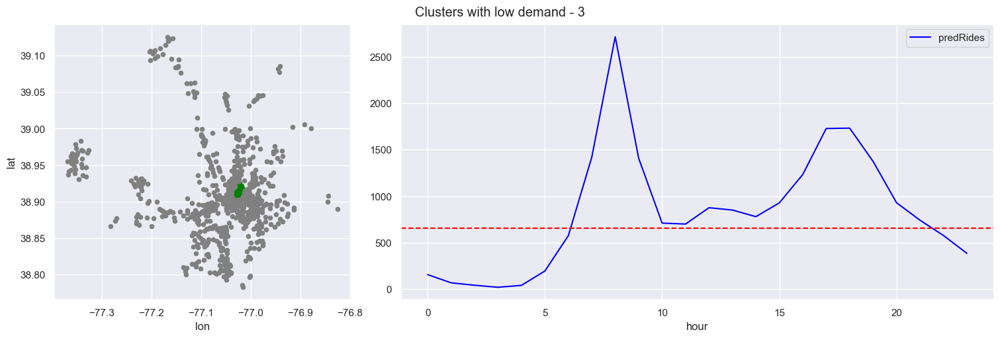

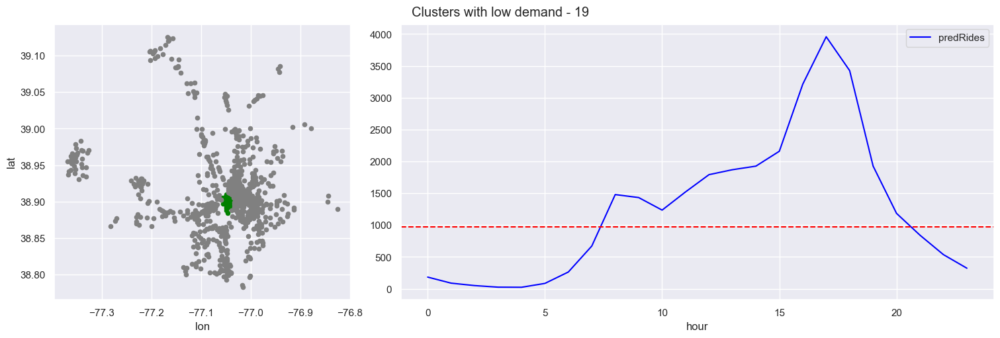

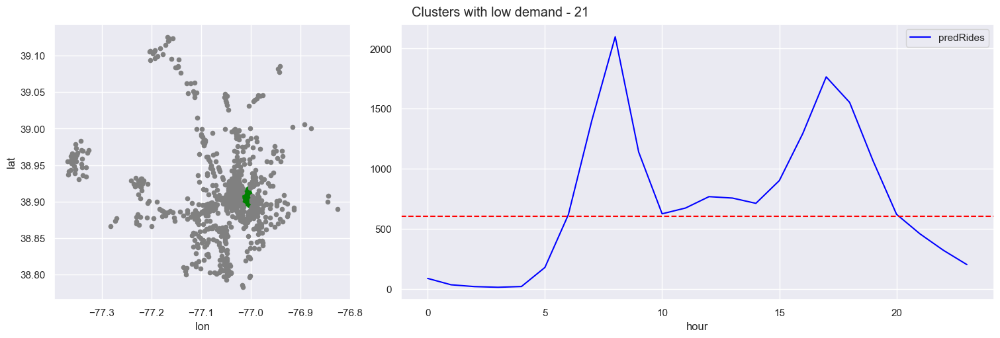

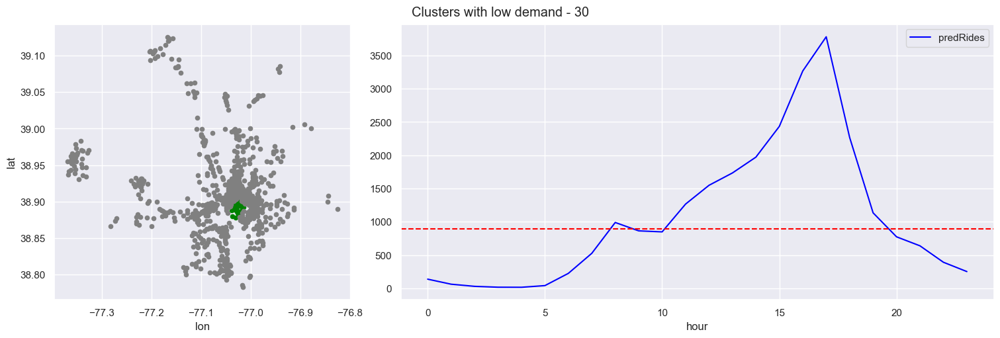

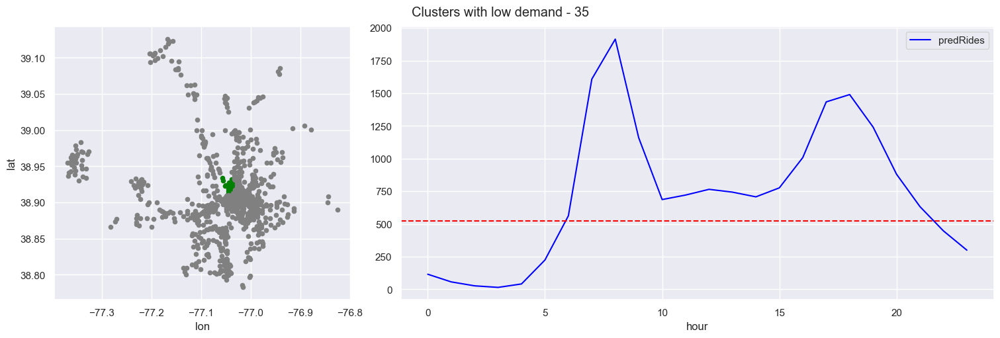

In [127]:
for cluster in clustersWithLowCapacity:
    fig = plt.figure(constrained_layout=True, figsize=(15,5))
    gs = fig.add_gridspec(1,3)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1:])

    trainData = getTrainingDataset(df, cluster)

    features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
    model, y_pred, r2, mae, rmse = randomForest(trainData, features)
    trainData.loc[:,"predRides"] = y_pred
    fi = getFeatImp(model, features)

    stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
    stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

    trainData.groupby("hour")["predRides"].median().reset_index().plot(x="hour", y="predRides", color="blue", ax=ax2)
    ax2.axhline(y=stationInfo.loc[cluster, "TotCap"], linestyle="--", color="red")

    fig.suptitle(f"Clusters with low demand - {cluster}")

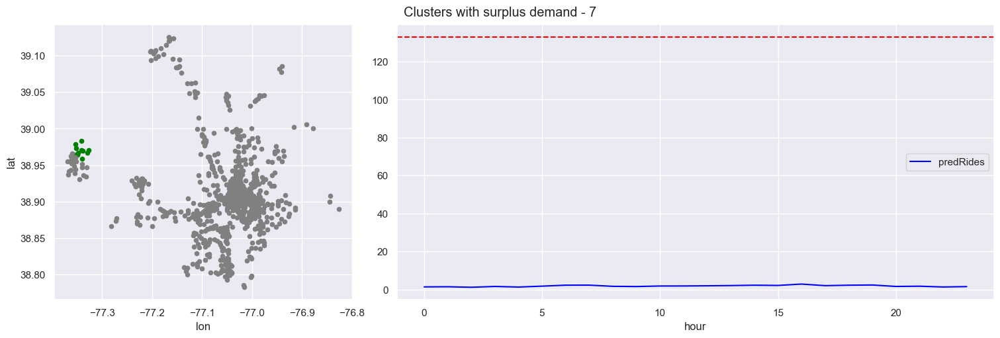

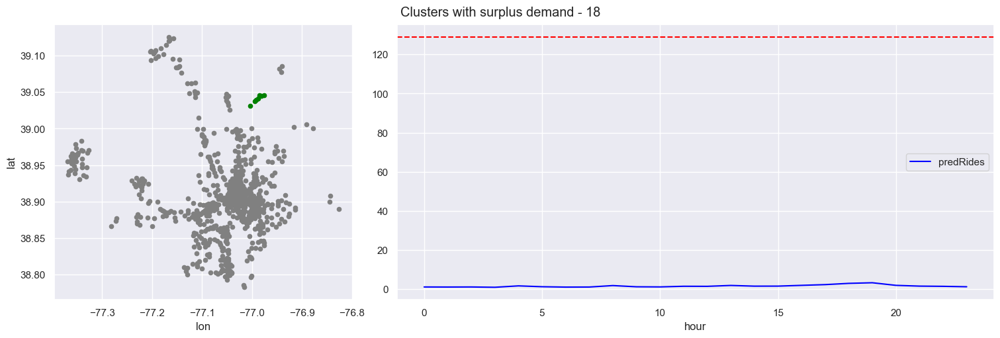

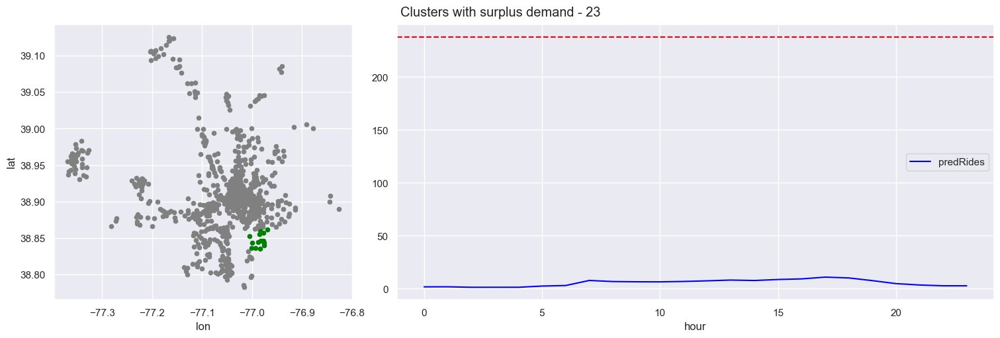

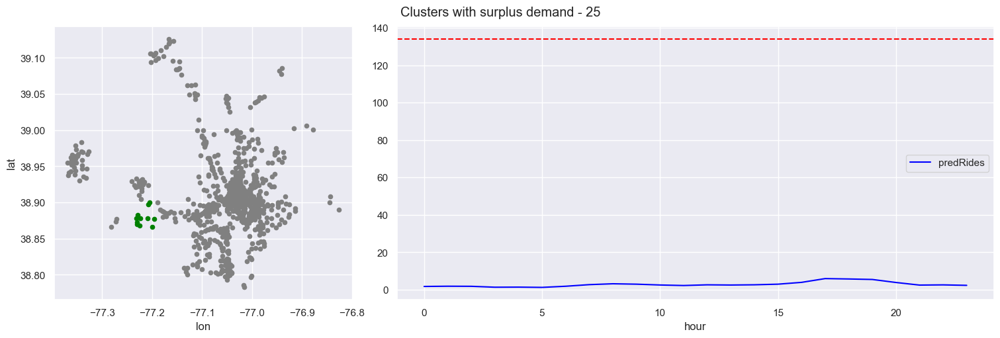

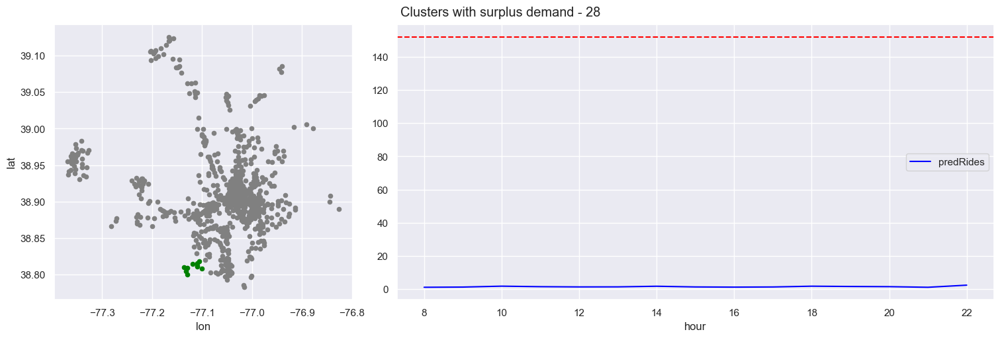

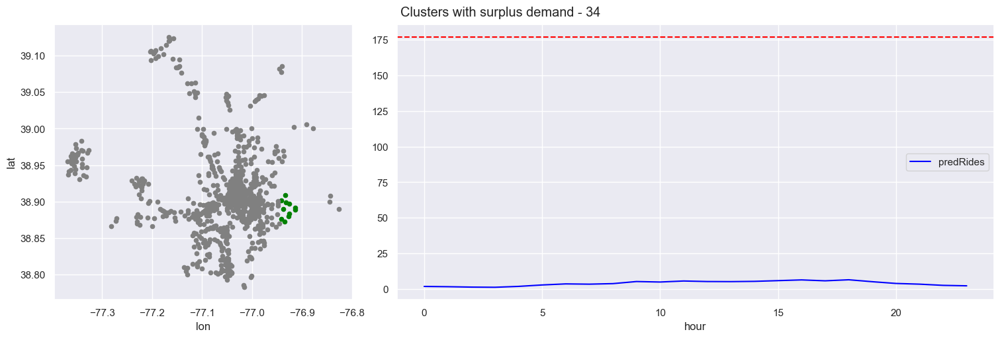

In [128]:
for cluster in clustersWithHighCapacity:
    fig = plt.figure(constrained_layout=True, figsize=(15,5))
    gs = fig.add_gridspec(1,3)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1:])

    trainData = getTrainingDataset(df, cluster)

    features = catFeatures + weatherFeatures + weekendFeature + holidayFeature
    model, y_pred, r2, mae, rmse = randomForest(trainData, features)
    trainData.loc[:,"predRides"] = y_pred
    fi = getFeatImp(model, features)

    stationData[stationData.cluster == cluster].plot.scatter(x="lon", y="lat", color="green", ax=ax1)
    stationData[stationData.cluster != cluster].plot.scatter(x="lon", y="lat", color="grey", ax=ax1)

    trainData.groupby("hour")["predRides"].median().reset_index().plot(x="hour", y="predRides", color="blue", ax=ax2)
    ax2.axhline(y=stationInfo.loc[cluster, "TotCap"], linestyle="--", color="red")

    fig.suptitle(f"Clusters with surplus demand - {cluster}")

In [134]:
import certifi
import ssl
import geopy.geocoders
from geopy.geocoders import Nominatim
ctx = ssl.create_default_context(cafile=certifi.where())
geopy.geocoders.options.default_ssl_context = ctx
geolocator = Nominatim(user_agent="dab-project", scheme='http')

In [144]:
geolocator.reverse((stationInfo.loc[7, 'Lat'], stationInfo.loc[clustersWithDifferentFeatures[0], 'Lon']))

Location(704, Potomac Knolls Drive, McLean, Fairfax County, Virginia, 22102, United States, (38.96935235, -77.22424499901543, 0.0))

In [145]:
geolocator.reverse((stationInfo.loc[14, 'Lat'], stationInfo.loc[clustersWithDifferentFeatures[2], 'Lon']))

Location(Custis Memorial Parkway, Antrim, Idylwood, Fairfax County, Virginia, 22043, United States, (38.8988843, -77.19317326029478, 0.0))